# Preguntas de intres:

#### 1: Los datos proporcionados por el data set seran suficientes para generar un modelo el cual te aproxime al precio de una casa?

#### 2: Que porcentage de los datos son inecesarios o no aportan al modelo anteriormente mencionado?

#### 3: Cuales son las columnas que aportan relevancia al modelo?

#### 4: Que tanto afecta al precio final cada variable, como el ano de construccion, servicios disponible, ubicacion, etc...? 

## Abstarc:

Esta base de datos fue extraida de kaggle la cual proporciona mas de 70 variables acerca de casas la cuales fueron vendidas en estados unidos entre los anos 2006 a 2010, dentro de estas variable se pueden encontrar datos como, precio de venta, metros cuadrados, ano en que fue construida, etc...

Lo que se busca con este proyecto es poder generar un analizis el cual permita saber aspectos esenciales que lleguen a determinar el costo de una vivienda en estados unidos, y con ello generar un modelo el cual entregandole ciertos datos sobre una casa genere una prediccion acerca del costo que esta misma deberia tener.

Para ello se pueden generar algunas hipotesis con las graficas antes generadas, primero se puede asumir que toda casa que este en un lote con un area mayor a 4600 metros cuadrados se consideran outliers, tambien las casas que cuesten mas de 500 mil dolares. Segundo a pesar de que a mitad de ano haya mayor cantidad de casas vendidas, esta no afecta al precio de la casa. Por ultimo, para el modelo solo se podria tener en cuenta dos tipos de precensia de servicios, ya que en todo el data set, solo de pueden ver AllPub y NoSeWa, a pesar de tambien haber otro tipo de resultados.

## Contexto comercial:

Entre el ano 2006 y 2010 se tomaron datos de al rededor de 1500 casas las cuales fueron vendidas en Estados Unidas, estas casas pertenecen a distintos sectores y cada casa posee una serie de amenidades las cuales alteron el valor al que fue vendida, por lo que cociendo ciertos parametros de una casa se podria llegar a una aproximacion de su precion con respecto a los datos almacenados. Tras llegar a un precio el cual tenga una estrecha relacion con los distintos aspectos de la vivienda, se debera de hacer una aproximacion al precio que deberia tener en la actualidad teniendo en cuenta la inflacion a traves de los anos. Con esa informacion se le puede compartir al cliente el precio recomendado al cual deberia poner en venta su propiedad.

## Pubico objetivo:

Duenos de casas en Estados Unidos, interesados en poner en venta su propiedad

In [1]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
import warnings
from sklearn.metrics import mean_squared_error, r2_score
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import MinMaxScaler

In [2]:
df = pd.read_csv('./HousePrices/dataHousePrices.csv')
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


## Explixacion de variables principales

-YearBuilt: Ano en el cual la casa fue construida

-SalePrice: Precio de la vivienda en 2010, en dolares

-GrLivArea: Superficie habitable sobre el nivel del suelo en pies cuadrados

-MoSold: Mes en el cual la casa fue vendida

-LotArea: Superficie del lote en pies cuadrados

-OverallQual: Nivel de calidad de los acabados de la casa; 1 muy malos y 10 exelentes

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [4]:
df = df.drop(['PoolQC', 'Fence', 'MiscFeature', 'GarageQual', 'GarageCond', 'PavedDrive', 'Alley'], axis=1)

Se eliminaron las columnas que no agregan mucho valor al proyecto, por la info que manejan o por la cantidad de datos ausentes

In [5]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [6]:
# Aqui se puede apreciar las distintas columnas que entregan datos numericos, lo cual sirve para entregarlo como variable a la regresion
numeric_cols = df.select_dtypes(include=['int64']).columns
numeric_cols

Index(['Id', 'MSSubClass', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars',
       'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

# Analisis univariado

### YearBuild:

<Axes: xlabel='YearBuilt', ylabel='Count'>

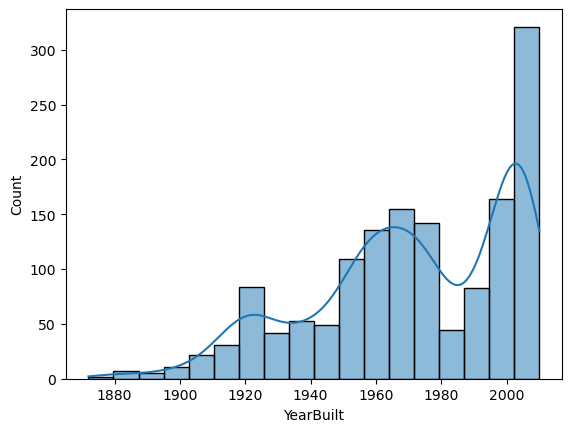

In [7]:
sns.histplot(data=df, x='YearBuilt', kde=True)

La anterior grafica, mustra la cantidad de casas vendidas dependiendo en la fecha de construccion de la casa, dando a ver que las mas nuevas son las que mas se venden

<Axes: xlabel='YearBuilt'>

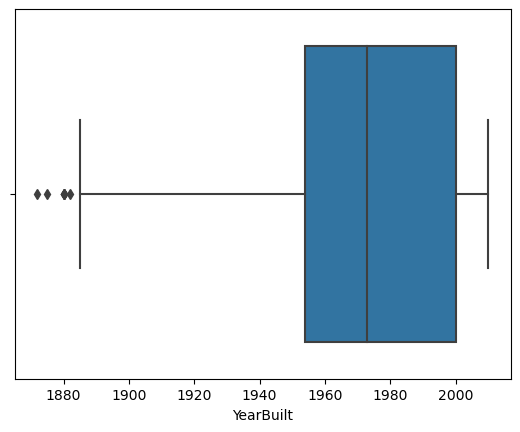

In [8]:
sns.boxplot(x=df["YearBuilt"])

Gracias al grafico anterior se puede ver como las casas fueron en promedio construidas al rededor de 1970, y que como datos que raramente se ven, estan las casas construidas antes de 1890, volviendo estos datos despreciables puesto que podrian llegar a alterar de manera negativa el modelo predictivo.

In [9]:
# Se eliminaron los datos de casas hechas antes de 1890
df = df[df['YearBuilt'] > 1890]

### SalePrice

<Axes: xlabel='SalePrice', ylabel='Count'>

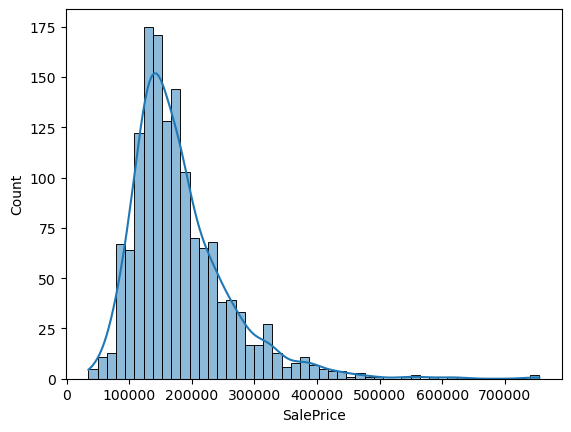

In [10]:
sns.histplot(data=df, x='SalePrice', kde=True)

En el grafico anterior se puede apreciar una curtosis alta, lo que implica que existe una mayor consentracion de datos, en este caso, entre los valores de 50 mil y 450 mil, por ende tambien se concluye que las casa tienden a tener precios bajos en perspectiva.

<Axes: xlabel='SalePrice'>

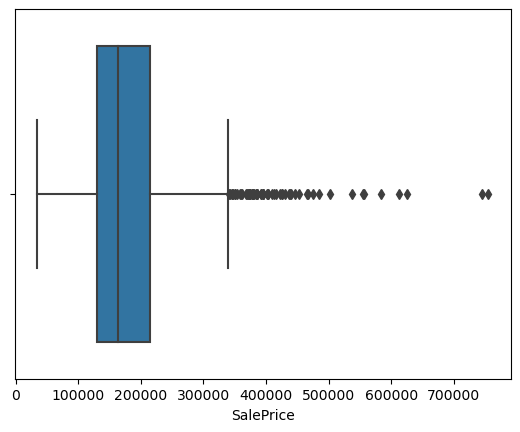

In [11]:
sns.boxplot(x=df["SalePrice"])

Gracias a este grafico se resalta de nuevo la idea de que raramente las casa llegan a superar un precio de 450 mil dolares por lo que aquellas que lo hacen podrian llegar a generar un conflicto a la hora de generar una prediccion.

In [12]:
# Se eliminaron los datos de casas con un precio mayor a 450 mil dolares
df = df[df['SalePrice']  <= 450000]

### GrLivArea

<Axes: xlabel='GrLivArea', ylabel='Count'>

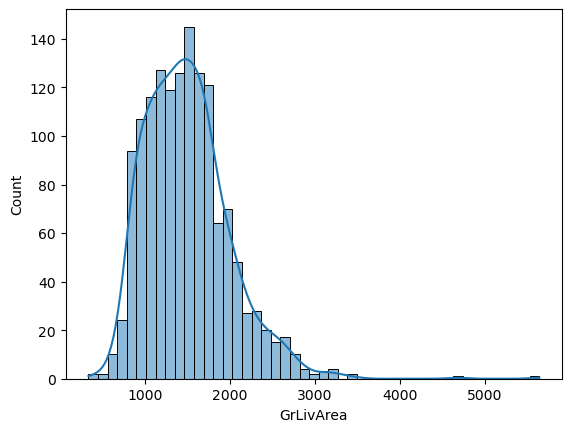

In [13]:
sns.histplot(data=df, x='GrLivArea', kde=True)

De nuevo se puede apreciar como los datos tienen una alta concentracion en valores bajos, mas espesificamente entr 500 y 2500 pies cuadrados.

<Axes: xlabel='GrLivArea'>

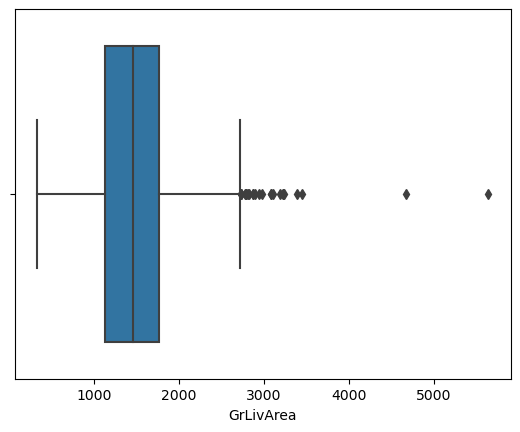

In [14]:
sns.boxplot(x=df["GrLivArea"])

Al ver como los datos presentes raramente llegan a pasar los 4000 pies cuadrados se podria deducir que los datos que tenga un valor mayor llegan a ser despreciables.

In [15]:
# Se eliminaron los datos de casas con un area de uso mayor a 4000 pies cuadrados
df = df[df['GrLivArea']  <= 4000]

### LotArea

<Axes: xlabel='LotArea', ylabel='Count'>

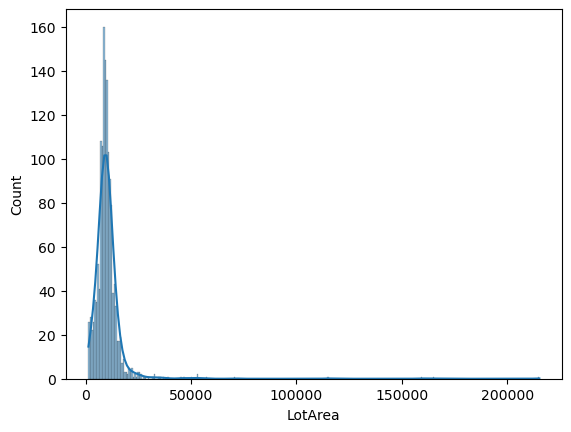

In [16]:
sns.histplot(data=df, x='LotArea', kde=True)

<Axes: xlabel='LotArea'>

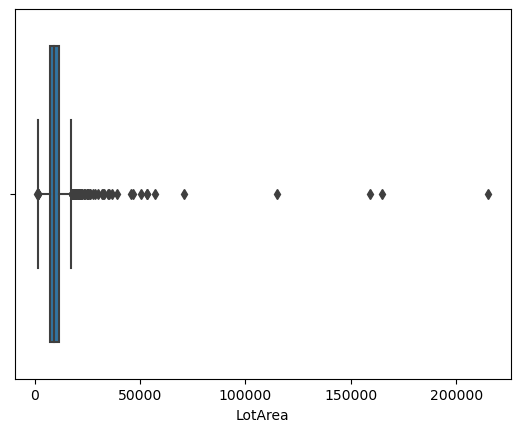

In [17]:
sns.boxplot(x=df["LotArea"])

In [18]:
print('Numero de casas que poseen un lote mayor a 50000 pies cuadrados:', len(df[df['LotArea']>50000]))

Numero de casas que poseen un lote mayor a 50000 pies cuadrados: 9


En esta variable mas que en las otras se logra distinguir una curtosis demaciado alta, puesto que muchos datos de encuentran entre un area de lote de 0 a 25 mil, pero llegan a existir casos donde el este area llega a superar los 200 mill, y al ver que unicamente 9 son los datos con un area mayor a 50 mil pies, se le considerara como datos despreciables.

In [19]:
# Se eliminaron los datos de casas con un area de lote mayor a 50000 pies cuadrados
df = df[df['LotArea']  < 50000]

# Analisis bivariado

<Axes: xlabel='YearBuilt', ylabel='SalePrice'>

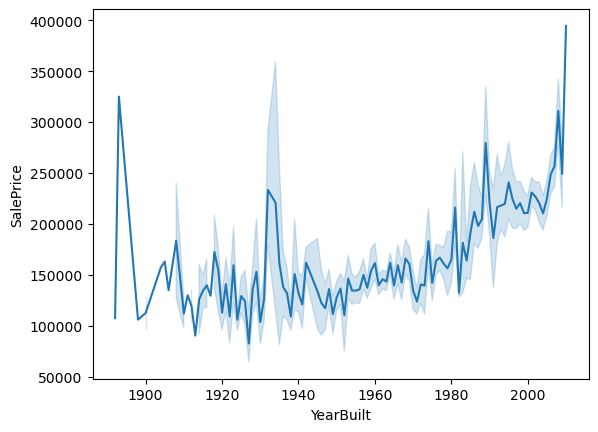

In [20]:
sns.lineplot(data=df, x="YearBuilt", y="SalePrice")

<Axes: xlabel='GrLivArea', ylabel='SalePrice'>

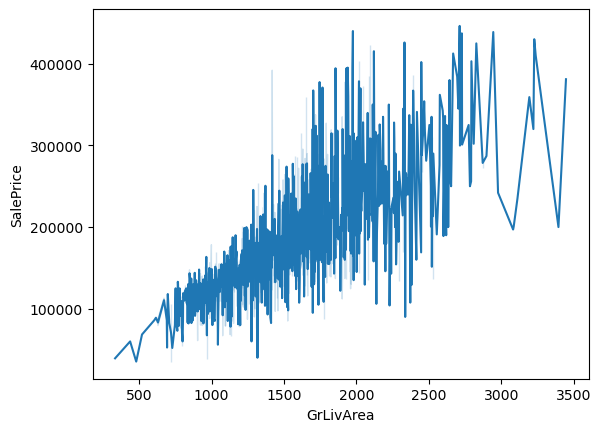

In [21]:
sns.lineplot(data=df, x="GrLivArea", y="SalePrice")

La grafica numero 1 muestra el precio promedio de las casas segun su fecha de construccion. Dando a entender como en promedio el precio sube entre mas nueva sea la casa, menos en 1895 y 1930. Mientras que en la segunda tambien se ve una relacion directa, pero con bastantes mas alteraciones.

Text(0.5, 1.0, 'Promedio de precio dependiendo del mes de venta')

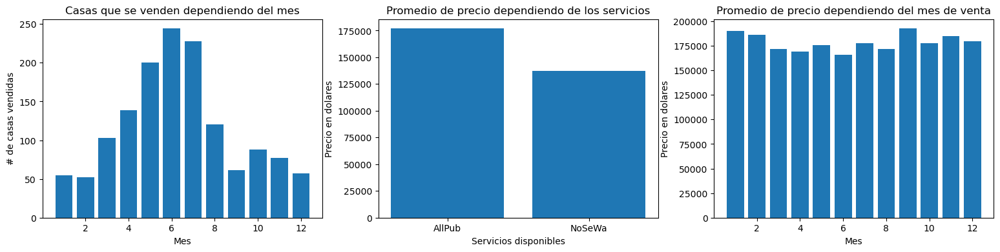

In [22]:
fig, ax = plt.subplots(1,3, figsize=(19,4))

df_ut = df.groupby('Utilities').agg({'SalePrice': 'mean'})
df_ye = df.groupby('YrSold').agg({'SalePrice': 'mean'})

df_per = df.groupby('MoSold').agg({'SalePrice': 'mean'})

#---------------------Grafica 1
ax[0].bar(df['MoSold'].value_counts().index, df['MoSold'].value_counts())
ax[0].set_ylabel('# de casas vendidas')
ax[0].set_xlabel('Mes')
ax[0].set_title('Casas que se venden dependiendo del mes')
#---------------------Grafica 2

ax[1].bar(df_ut.index, df_ut['SalePrice'])
ax[1].set_ylabel('Precio en dolares')
ax[1].set_xlabel('Servicios disponibles')
ax[1].set_title('Promedio de precio dependiendo de los servicios')
#---------------------Grafica 3
ax[2].bar(df['MoSold'].value_counts().index, df_per['SalePrice'])
ax[2].set_ylabel('Precio en dolares')
ax[2].set_xlabel('Mes')
ax[2].set_title('Promedio de precio dependiendo del mes de venta')

#### Gracfica 1
Se puede apreciar la relacion que se tiene entre la cantidad de casa vendidas y el su mes de venta, concluyendo que los se tiende a vender mas casas a mitad de ano, esto puede darse por varias razones, como la incertidumbre.

#### Grafica 2
Se puede apreciar como la cantidad de servicios que dispone la casa altera su precio, siendo mayor si posee todos los servicios.

#### Grafica 3
Se puede ver que relacion tiene el mes de venta con el precio de la casa, se puede extraer que no existe mucha relacion, por lo que la cantidad de casas vendidas por mes no afecta el precio de venta.

# Analisis multivariado

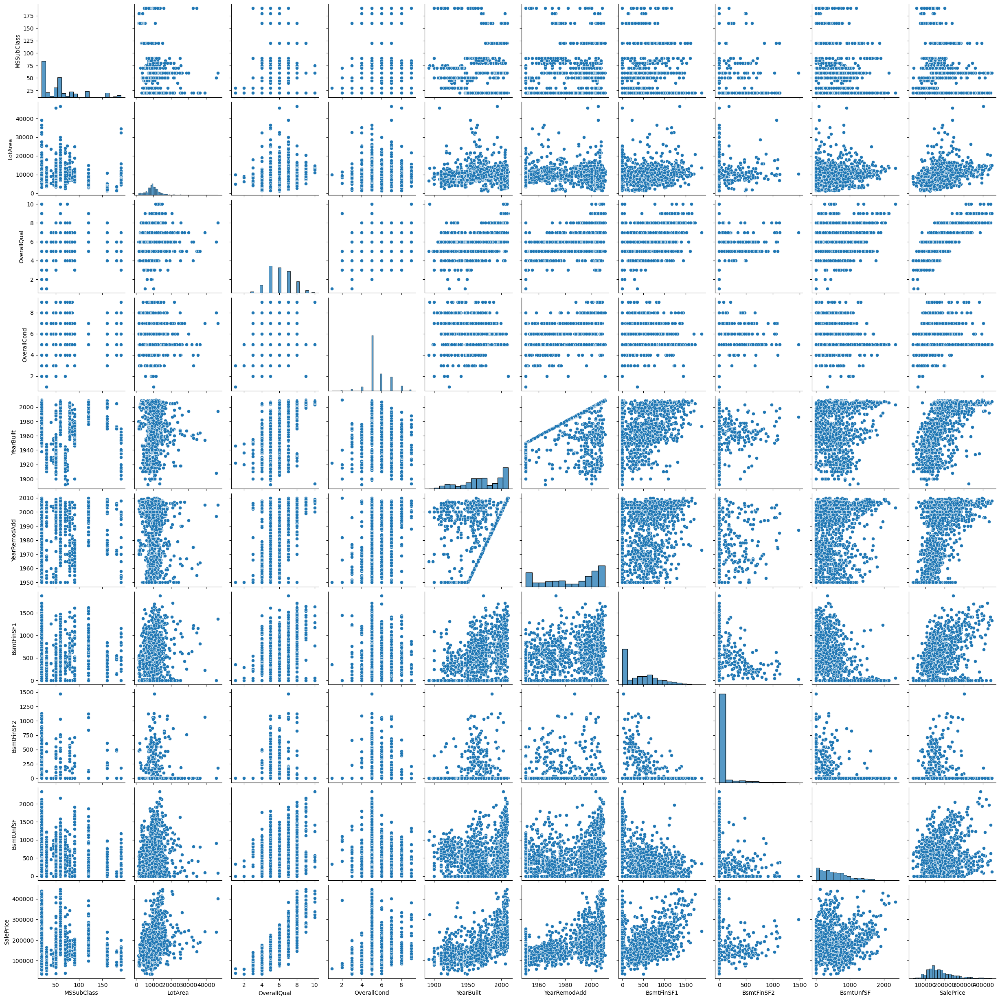

In [23]:
cols2 = ['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'SalePrice']

sns.pairplot(df[cols2])

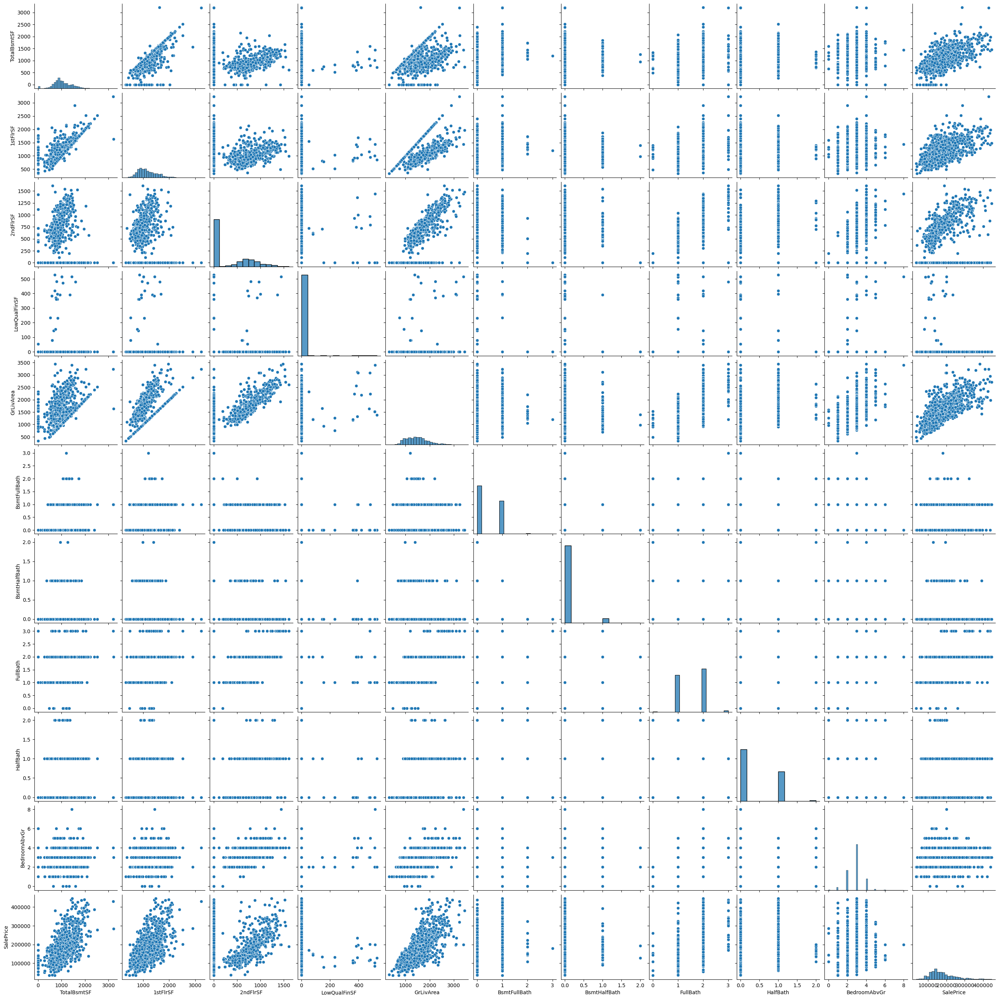

In [24]:
cols3 = [
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr','SalePrice']
sns.pairplot(df[cols3])

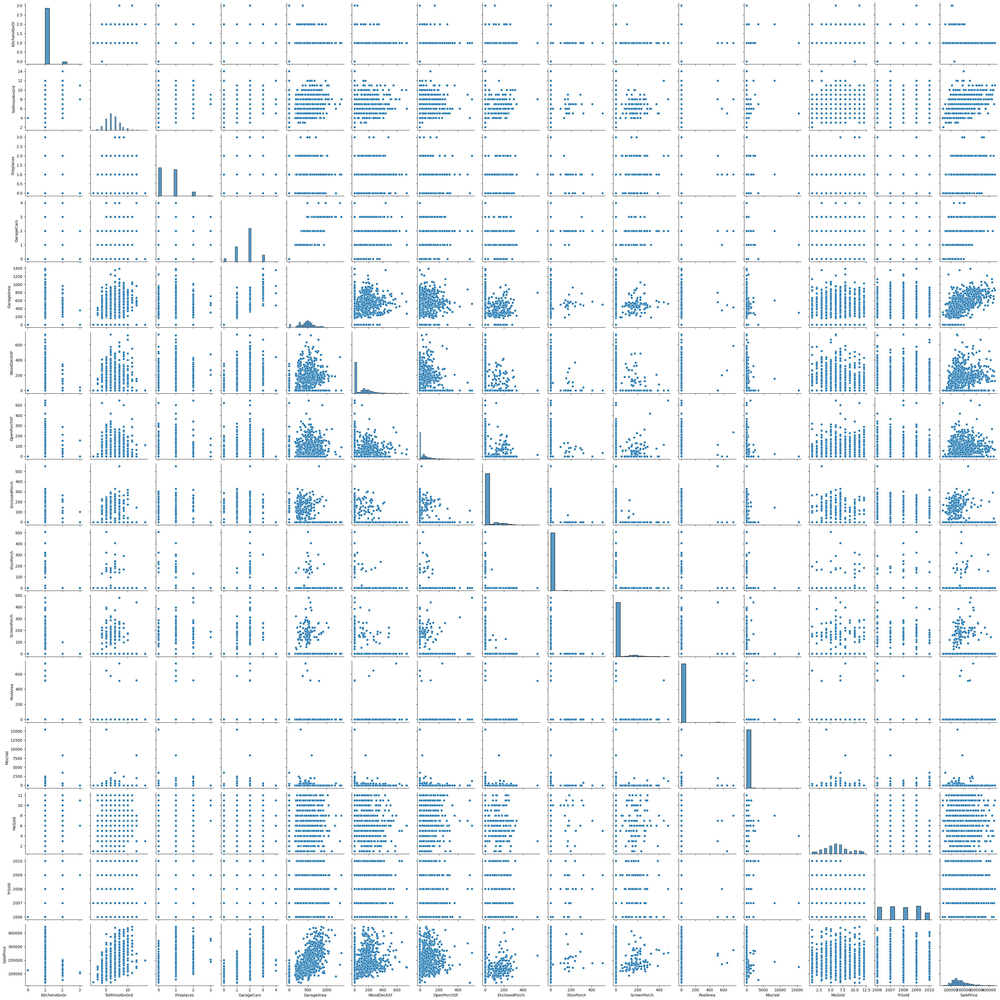

In [25]:
cols4 = ['KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars',
       'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']

sns.pairplot(df[cols4])

Gracias a los graficos mostrados anteriormente, se puede llegar a la conclucion de que las siguientes variables a columnas pueden llegar a aportar gran valor a la regresion lineal que se quiere alcanzar, por la relacion que mantienen con la variable objetivo, 'SalePrice'.
- LotArea
- OverallQual
- YearBuilt
- YearRemodAdd
- BsmtFinSF1
- BsmtFinSF2
- BsmtUnfSF
- TotalBsmtSF
- 1stFlrSF 
- 2ndFlrSF
- LowQualFinSF
- GrLivArea
- TotRmsAbvGrd
- GarageCars
- WoodDeckSF

In [26]:
cols = ['LotArea',
'OverallQual',
'YearBuilt',
'YearRemodAdd',
'BsmtFinSF1',
'BsmtFinSF2',
'BsmtUnfSF',
'TotalBsmtSF',
'1stFlrSF',
'2ndFlrSF',
'LowQualFinSF',
'GrLivArea',
'TotRmsAbvGrd',
'GarageCars',
'WoodDeckSF',
'SalePrice']

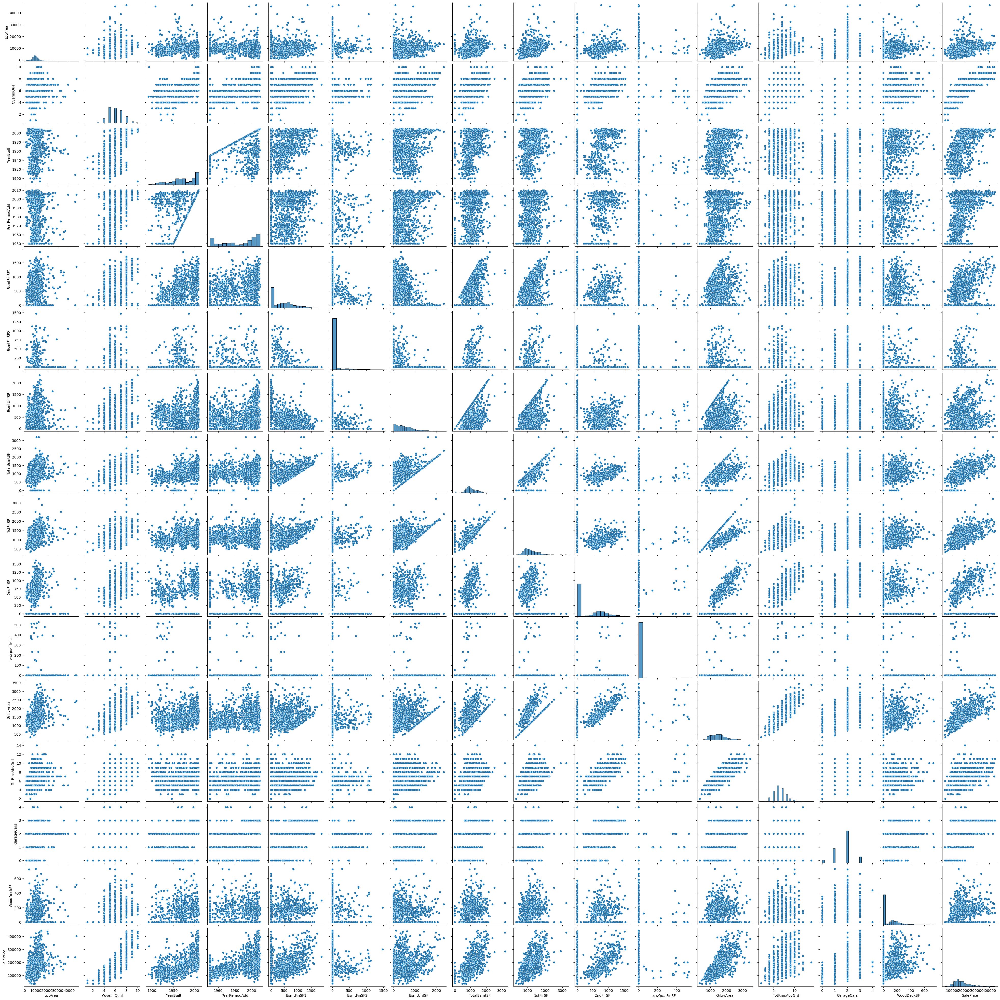

In [27]:
sns.pairplot(df[cols])

<Axes: >

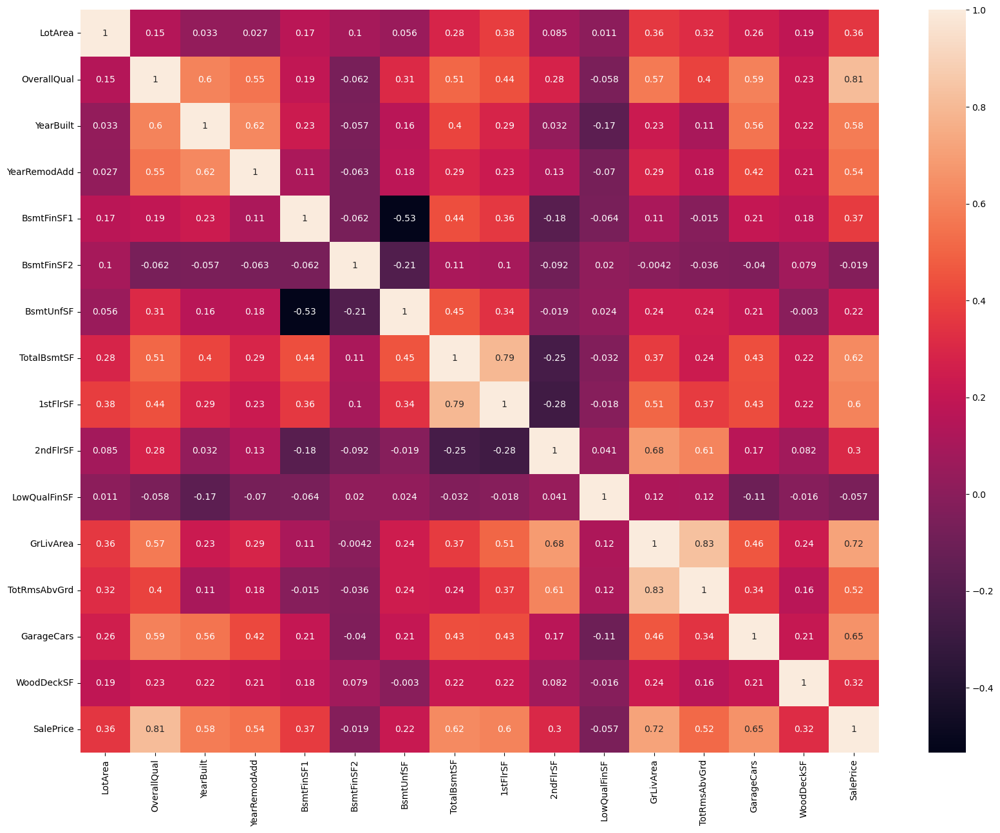

In [28]:
plt.subplots(figsize=(20,15))
sns.heatmap(df[cols].corr(), annot=True)

Gracias a las graficas proyectadas anteriormente puede concluir que en general los datos llegan a proporsionar gran variedad de informacion puesto que su correlaciones no son muy altas, asi que no vale la pena eliminar ninguno de los datos suministrados. Por parte de la calidad de los acabados, se ve como tiene una alta relacion directa con el precio, cual tiene sentido puesto que es un factor el cual llega a generar grandes gastos en el momento de construccion de una casa. Es importante destacar que en este caso llego a considerar una correlacion de 0.9 o mayor, una lo suficientemente alta para que alguno de los valores no aporte.

# Modelo no supervisado

In [29]:
# Se genera la divicion de datos usados para el entrenamiento y para generar las pruebas
X_train, X_test, y_train, y_test = train_test_split(df[cols[:15]], 
                                                    df['SalePrice'], test_size=0.2)


In [30]:
# Se modifican las proporciones de los distintos valores para que el modelo a utilizar no genere preferencias por pesos
scalerX = MinMaxScaler()

modX = scalerX.fit(X_train)
col = X_train.columns

X_trainSc = pd.DataFrame(modX.transform(X_train))
X_trainSc.columns = col

X_testSc = pd.DataFrame(modX.transform(X_test))
X_testSc.columns = col


X_trainSc['LotArea']

0       0.172669
1       0.191327
2       0.200534
3       0.144870
4       0.131423
          ...   
1134    0.173155
1135    0.244960
1136    0.196339
1137    0.146217
1138    0.221157
Name: LotArea, Length: 1139, dtype: float64

<Axes: >

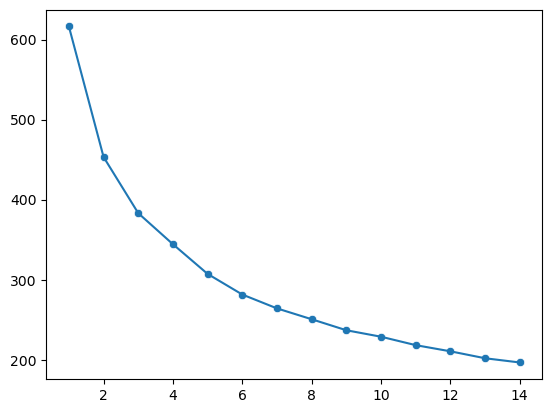

In [31]:
K = range(1, 15)

distortions = []
inertias = []

for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(X_trainSc)
 
    inertias.append(kmeanModel.inertia_)

sns.lineplot(data=K, x=K, y=inertias)
sns.scatterplot(data=K, x=K, y=inertias)

La grafica muestra el impacto que tiene el numero de clusters sobre como se divide el dataset, con ello se puede decir que 5 centroides llegan a ser suficientemente relevantes, sin caer en el desuso.

In [32]:
kmeans = KMeans(n_clusters=5)

modelK = kmeans.fit(X_trainSc)

X_trainSc['Groups'] = modelK.predict(X_trainSc)

X_testSc['Groups'] = kmeans.predict(X_testSc)

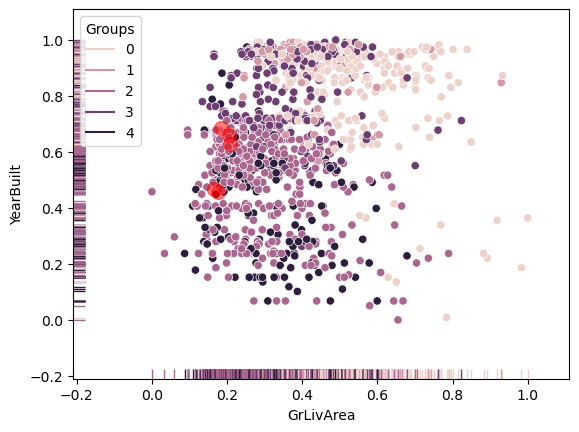

In [33]:
sns.scatterplot(data=X_trainSc, x="GrLivArea", y="YearBuilt", hue='Groups')
sns.rugplot(data=X_trainSc, x="GrLivArea", y="YearBuilt", hue='Groups')

centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=100, alpha=0.5);

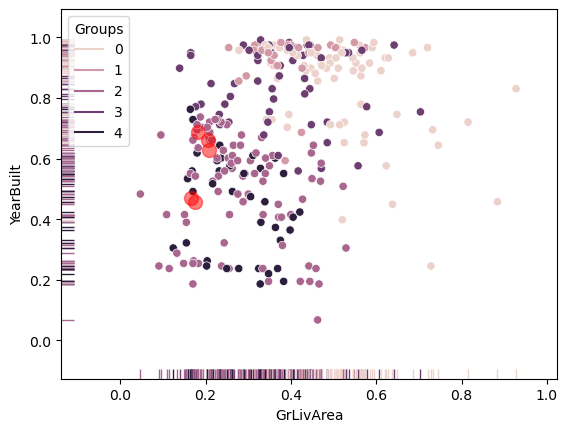

In [34]:
sns.scatterplot(data=X_testSc, x="GrLivArea", y="YearBuilt", hue='Groups')
sns.rugplot(data=X_testSc, x="GrLivArea", y="YearBuilt", hue='Groups')

centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=100, alpha=0.5);

En la grafica se puede apreciar como se generan 4 principales grupos teniendo en cuenta el area de vivienda, el precio y el ano de construccion. No se ve perfectamente dividido, esto sucede porque se esta intentando mostrar en 2 dimenciones 14 variables distintas, por eso mismo los puntos centrales parecen no estar ni siquiera en la conglomeracion de puntos en general. Con esta divicion por grupos podemos sacar algunas ideas, por ejemplo existe un grupo, el 3, el cual se caracteriza por tener un espacio aplio de vivienda, y haber sido construido hace menos anos, y por ende tener un precio superior a la media. Por otro lado se encuentran los grupos 2 y 1, los cuales llaman la atencion por tener un tamano y precio muy similar y alrededor de la media, pero se diferencian por se mas nuevas casas del grupo 2.

# Descomposicion de datos

In [35]:
colsForPCA = cols[:15]
nums = np.arange(10)
var_ratio = []
for num in nums:
  pca = PCA(n_components=num)
  pca.fit(df[colsForPCA])
  var_ratio.append(np.sum(pca.explained_variance_ratio_))

Text(0, 0.5, 'Porcentage de variansa')

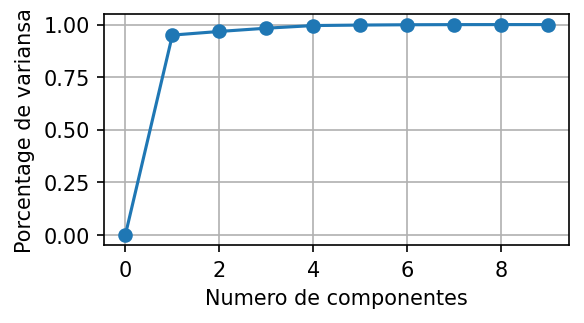

In [36]:
import matplotlib.pyplot as plt

plt.figure(figsize=(4,2),dpi=150)
plt.grid()
plt.plot(nums,var_ratio,marker='o')
plt.xlabel('Numero de componentes')
plt.ylabel('Porcentage de variansa')

Lo que se busca con la reduccion de dimencionalidad es recoger la mayor cantidad de informacion posible con la menor cantidad de variables, por como se ve en la grafica se pudo reducir el numero de componentes a 4 manteniendo mas del 75% de la imformacion de los datos, asi que ese sera el numero de componentes a elegir.

In [37]:
pca = PCA(n_components=4)
pca_features = pca.fit_transform(df[cols[:15]])
pca_df = pd.DataFrame(
    data=pca_features, 
    columns=['PC1', 'PC2', 'PC3', 'PC4'])

# pca_df['Groups'] = df['Groups']
pca_df

,PC1,PC2,PC3,PC4
0,-1318.348581,-80.991554,-432.289143,685.186273
1,-165.302835,-218.441700,663.532800,339.735037
2,1481.320254,23.055245,-547.923913,337.699681
3,-226.074970,47.375428,-615.094079,88.144402
4,4520.792883,371.296838,-561.523753,562.091965
...,...,...,...,...
1419,-1855.676097,370.367171,-544.700090,-297.825267
1420,3467.711294,669.094669,730.712630,286.585641
1421,-684.672771,965.905455,-741.952032,304.050173
1422,-79.359371,-610.874919,180.527306,-126.407687


In [38]:
pca_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1424 entries, 0 to 1423
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   PC1     1424 non-null   float64
 1   PC2     1424 non-null   float64
 2   PC3     1424 non-null   float64
 3   PC4     1424 non-null   float64
dtypes: float64(4)
memory usage: 44.6 KB


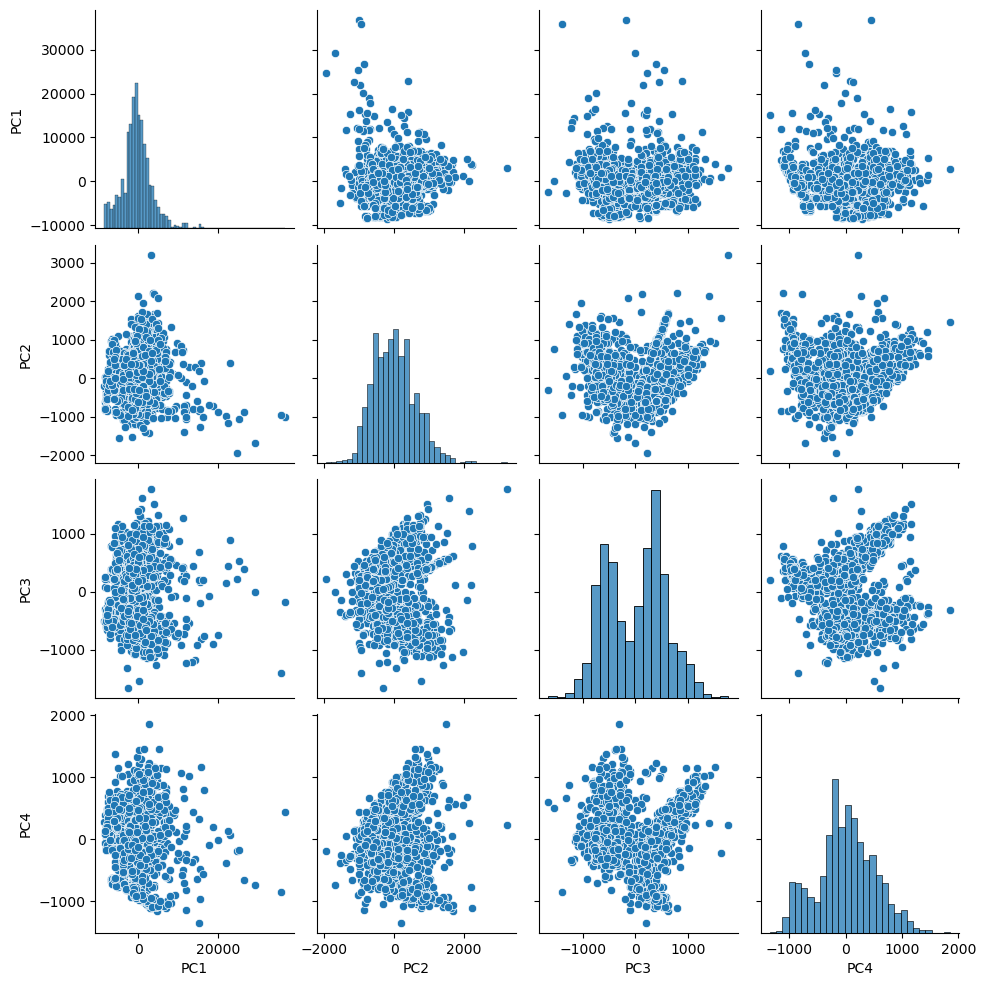

In [39]:
sns.pairplot(pca_df)

Tras la reduccion de dimencionalidad se puede llegar a apreciar un error el cual impide que esta dataFrame sea utilizado para generar el modelo, puesto que al tener todos una informacion muy variada (con baja correlacion), no es posible generar una regresion lineal.

# Generacion de modelo predictivo

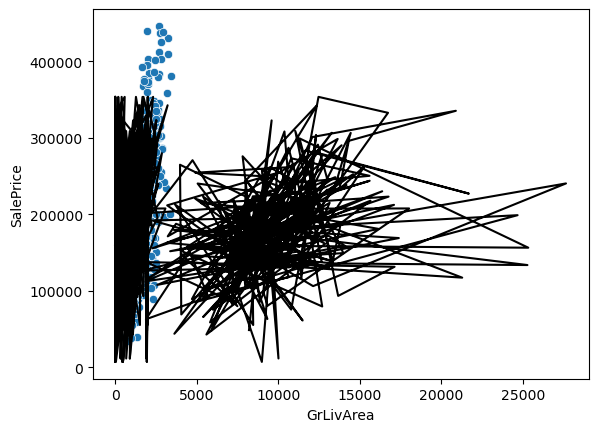

In [40]:
linear_model= LinearRegression()

linear_model.fit(X_train, y_train)

predictions = np.array(linear_model.predict(X_test))

predictions = np.floor(predictions)

sns.scatterplot(x=X_train["GrLivArea"], y=y_train)
plt.plot(X_test, predictions,color='k') 

In [41]:
pd.concat([pd.DataFrame(X_train.columns, columns=['Variable']), pd.DataFrame(linear_model.coef_, columns=['Coeficiente de regresion'])], axis =1)

,Variable,Coeficiente de regresion
0,LotArea,1.235500
1,OverallQual,17861.669323
2,YearBuilt,182.947151
3,YearRemodAdd,352.482709
4,BsmtFinSF1,22.702374
5,BsmtFinSF2,-0.561440
6,BsmtUnfSF,-0.579710
7,TotalBsmtSF,21.561224
8,1stFlrSF,28.724441
9,2ndFlrSF,27.008953


Gracias a la tabla antes mostrada se pueden apreciar en que medida aportan las distintas variables al resultado del precio, siendo 'OverallQual', 'GarageCars' y 'TotRmsAbvGrd' los que tienden a tener un mayor peso cuando se determino la ecuacion de regresion lineal.

In [42]:
print("R2 score:", r2_score(y_test, predictions))

R2 score: 0.8457883989867987


Gracias al termino antes obtenido, '0.858', se puede asumir que las dos variables se encuentran sumamente correlacionada, por lo que los resultados del modelo predictivo tiene una variansa de tan solo 15% con respecto a los datos que se esperaban obtener.

In [43]:
print("Mean squared error: ", mean_squared_error(y_test, predictions))

Mean squared error:  717827857.2385964


Gracias al coefisiente de error cuadrado promedio, se pude ver cuando se alejan los datos predecidos de los reales en promedio, pero este valor termina sinendo mayor que los datos manejados puesto que este como el nombre lo indica, eleva al cuadrado los datos a evaluar, por lo que para dimensionarlo mejor, se podria elevar al cuadrado los datos que se tendran en cuenta, o se podia redimencionar los disintos valores para que se muevan entre un rango de -1 y 1

# Conclucion

Se logro llegar a un modelo de regresion lineal el cual no se puede graficar puesto que se estaria intentanto mostrar 5 dimenciones en tan solo 2, por lo que visualmente no tiene congruencia. De resto se consiguio generar un modelo apropiado el cual se estima que tiene un acierto del 85% lo cual puede llegar a ayudar a dar una idea sobre cuato pueden llegar a cobrar personas que tienen pensado vender su casa.